In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


In [ ]:
# 최근 3개월 데이터 불러오기
data01 = pd.read_csv('/content/KS_NFA_FTNESS_MESURE_MVN_PRSCRPTN_GNRLZ_INFO_202310.csv')
data02 = pd.read_csv('/content/KS_NFA_FTNESS_MESURE_MVN_PRSCRPTN_GNRLZ_INFO_202309.csv')
data03 = pd.read_csv('/content/KS_NFA_FTNESS_MESURE_MVN_PRSCRPTN_GNRLZ_INFO_202308.csv')

In [ ]:
# 최근 3개월 데이터 결합
data = pd.concat([data01, data02, data03], axis=0)

In [ ]:
# 데이터 크기 확인
data.shape

(56431, 51)

In [ ]:
temp00 = np.array(data.isna().sum() / data.shape[0])
temp00

array([0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       1.41287590e-01, 5.27635519e-01, 1.41517960e-01, 1.41535681e-01,
       4.43018908e-04, 4.25298152e-04, 7.94563272e-01, 8.59651610e-01,
       5.90101186e-03, 7.95591076e-01, 7.96849250e-01, 7.94705038e-01,
       7.94829083e-01, 7.94829083e-01, 0.00000000e+00, 4.53491875e-01,
       5.17889104e-01, 8.98566391e-01, 4.06212897e-01, 8.99576474e-01,
       9.99344332e-01, 9.00409349e-01, 8.99452429e-01, 8.99665078e-01,
       1.06324538e-04, 1.00000000e+00, 6.58113448e-01, 9.17811132e-01,
       9.17811132e-01, 9.17882015e-01, 9.73277099e-01, 9.17882015e-01,
       6.70464815e-01, 6.70464815e-01, 1.00000000e+00, 1.00000000e+00,
       5.55244458e-01, 8.17706580e-01, 1.98826886e-02])

In [ ]:
# 80% 이상 not null인 열만 추출
temp01 = data.isna().sum() < data.shape[0]*0.2
temp01 = temp01[temp01 == True].index
using_cols = list(temp01)
data_droped = data[using_cols]

# 확인
data_droped.shape

(56431, 21)

In [ ]:
# 이외의 불필요한 데이터 탐색 1 : 측정 지역
len(data_droped['CNTER_NM'].value_counts())

81

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Selecting previously unselected package fonts-nanum.
(Reading database ... 123632 files and directories currently installed.)
Preparing to unpack .../fonts-nanum_20200506-1_all.deb ...
Unpacking fonts-nanum (20200506-1) ...
Setting up fonts-nanum (20200506-1) ...
Processing triggers for fontconfig (2.13.1-4.2ubuntu5) ...


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 44288 (\N{HANGUL SYLLABLE GWAN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47532 (\N{HANGUL SYLLABLE RI}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51088 (\N{HANGUL SYLLABLE JA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51064 (\N{HANGUL SYLLABLE IN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 48148 (\N{HANGUL SYLLABLE BA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPy

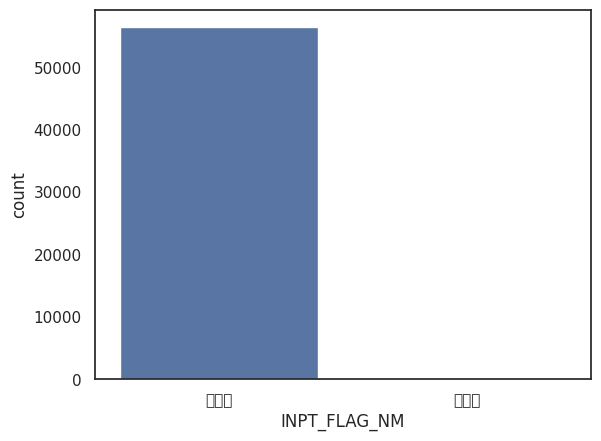

In [ ]:
# 한글 폰트 설치
!apt-get update -qq
!apt-get install -qq fonts-nanum

# 설치된 폰트를 Matplotlib에 등록
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

plt.rcParams['font.family'] = 'NanumGothic'

# 이외의 불필요한 데이터 탐색 2 : 입력 방법
sns.barplot(data_droped['INPT_FLAG_NM'].value_counts())
plt.show()

In [ ]:
# 불필요한 데이터 추가 삭제
drop_cols = ['MBER_SEQ_NO_VALUE', 'MESURE_PLACE_FLAG_NM', 'AGRDE_FLAG_NM', 'MESURE_DE', 'MVM_PRSCRPTN_CN', 'CNTER_NM', 'INPT_FLAG_NM']
data_droped = data_droped.drop(drop_cols, axis=1)
data_droped.shape

(56431, 14)

In [ ]:
data_droped.head()

,MESURE_SEQ_NO,MESURE_AGE_CO,CRTFC_FLAG_NM,SEXDSTN_FLAG_CD,MESURE_IEM_001_VALUE,MESURE_IEM_002_VALUE,MESURE_IEM_003_VALUE,MESURE_IEM_005_VALUE,MESURE_IEM_006_VALUE,MESURE_IEM_007_VALUE,MESURE_IEM_008_VALUE,MESURE_IEM_012_VALUE,MESURE_IEM_018_VALUE,MESURE_IEM_028_VALUE
0,3,18,참가,F,168.7,69.4,32.5,71.0,125.0,30.4,35.6,24.8,24.4,51.3
1,1,57,참가,M,162.2,71.3,33.4,76.0,124.0,35.4,33.0,4.2,27.1,49.6
2,1,30,2등급,M,169.6,74.3,15.0,91.0,153.0,46.4,46.1,19.5,25.8,62.4
3,1,26,3등급,F,168.5,59.6,22.3,67.0,113.0,23.6,28.6,13.4,21.0,48.0
4,1,64,참가,M,174.3,75.9,27.6,81.0,130.0,39.9,44.6,10.3,25.0,58.8


In [ ]:
# 컬럼명 수정
data_renamed = data_droped.rename({
    'MESURE_SEQ_NO' : 'Mesure_round',
    'MESURE_AGE_CO' : 'Age',
    'MESURE_IEM_001_VALUE' : 'Height',
    'MESURE_IEM_002_VALUE' : 'Weight',
    'MESURE_IEM_003_VALUE' : 'Fat_rate',
    'CRTFC_FLAG_NM' : 'Grade',
    'SEXDSTN_FLAG_CD' : 'Gender',
    'MESURE_IEM_005_VALUE' : 'D_min_bld_press',
    'MESURE_IEM_006_VALUE' : 'S_max_bld_press',
    'MESURE_IEM_007_VALUE' : 'L_grip_force',
    'MESURE_IEM_008_VALUE' : 'R_grip_force',
    'MESURE_IEM_012_VALUE' : 'Flexibility',
    'MESURE_IEM_018_VALUE' : 'BMI',
    'MESURE_IEM_028_VALUE' : 'Grip_force_per_weight'
}, axis = 1)

In [ ]:
# 확인
data_renamed.head()

,Mesure_round,Age,Grade,Gender,Height,Weight,Fat_rate,D_min_bld_press,S_max_bld_press,L_grip_force,R_grip_force,Flexibility,BMI,Grip_force_per_weight
0,3,18,참가,F,168.7,69.4,32.5,71.0,125.0,30.4,35.6,24.8,24.4,51.3
1,1,57,참가,M,162.2,71.3,33.4,76.0,124.0,35.4,33.0,4.2,27.1,49.6
2,1,30,2등급,M,169.6,74.3,15.0,91.0,153.0,46.4,46.1,19.5,25.8,62.4
3,1,26,3등급,F,168.5,59.6,22.3,67.0,113.0,23.6,28.6,13.4,21.0,48.0
4,1,64,참가,M,174.3,75.9,27.6,81.0,130.0,39.9,44.6,10.3,25.0,58.8


In [ ]:
# 결측치 확인
data_renamed.isna().sum()

,0
Mesure_round,0
Age,0
Grade,0
Gender,0
Height,0
Weight,0
Fat_rate,7973
D_min_bld_press,7986
S_max_bld_press,7987
L_grip_force,25


In [ ]:
# 성별에 따른 평균값으로 결측치 대체
for col in ['Fat_rate', 'D_min_bld_press', 'S_max_bld_press', 'L_grip_force', 'R_grip_force', 'Flexibility', 'Grip_force_per_weight']:
    # 남성 평균값 계산
    male_mean = data_renamed.loc[data_renamed['Gender'] == 'M', col].mean()
    # 여성 평균값 계산
    female_mean = data_renamed.loc[data_renamed['Gender'] == 'F', col].mean()

    # 결측치 대체
    data_renamed.loc[(data_renamed['Gender'] == 'M') & (data_renamed[col].isna()), col] = male_mean
    data_renamed.loc[(data_renamed['Gender'] == 'F') & (data_renamed[col].isna()), col] = female_mean

In [ ]:
# 결측치 제거 확인
data_renamed.isna().sum()

,0
Mesure_round,0
Age,0
Grade,0
Gender,0
Height,0
Weight,0
Fat_rate,0
D_min_bld_press,0
S_max_bld_press,0
L_grip_force,0


In [ ]:
# 데이터 시각화 탐색
# mosaic plot
from statsmodels.graphics.mosaicplot import mosaic

# scipy 가설 검정 도구
import scipy.stats as spst

# 수치 단변량 EDA : 기초통계량, histogram, boxplot
def eda_1_n(feature, data=data, bins = 30) :
    # 기초 통계량
    display(data[[feature]].describe().T)

    # 시각화
    print(f'{feature} 단변량 시각화')
    # histogram
    plt.figure(figsize = (12,8))
    plt.subplot(2,1,1)
    sns.histplot(data[feature], bins = bins, kde = True)
    plt.grid()

    # boxplot
    plt.subplot(2,1,2)
    sns.boxplot(x = data[feature])
    plt.grid()
    plt.tight_layout()
    plt.show()

# 범주 단변량 EDA : 기초통계량, countplot, pieplot
def eda_1_c(feature, data=data) :
    # 기초 통계량
    print(f'{feature}의 범주, 양, 비율')
    cnt = data[feature].value_counts()
    ratio = data[feature].value_counts(normalize=True)
    temp = pd.DataFrame({'Class':cnt.index, 'Count':cnt.values, 'Ratio':ratio.values})
    display(temp)

    # 시각화
    print(f'{feature} 단변량 시각화')
    # countplot
    plt.figure(figsize=(10,5))
    plt.subplot(1, 2, 1)
    sns.countplot(x = feature, data = data)
    plt.grid()

    # pieplot
    temp2 = data[feature].value_counts()
    explode = [0.03 for i in range(len(temp.index))]
    plt.subplot(1, 2, 2)
    plt.pie(temp2.values, labels = temp2.index, autopct = '%.2f%%',
        startangle=90, counterclock=False,
        explode = explode, shadow=True)
    plt.tight_layout()
    plt.show()

Gender의 범주, 양, 비율


,Class,Count,Ratio
0,M,32052,0.567986
1,F,24379,0.432014


Gender 단변량 시각화


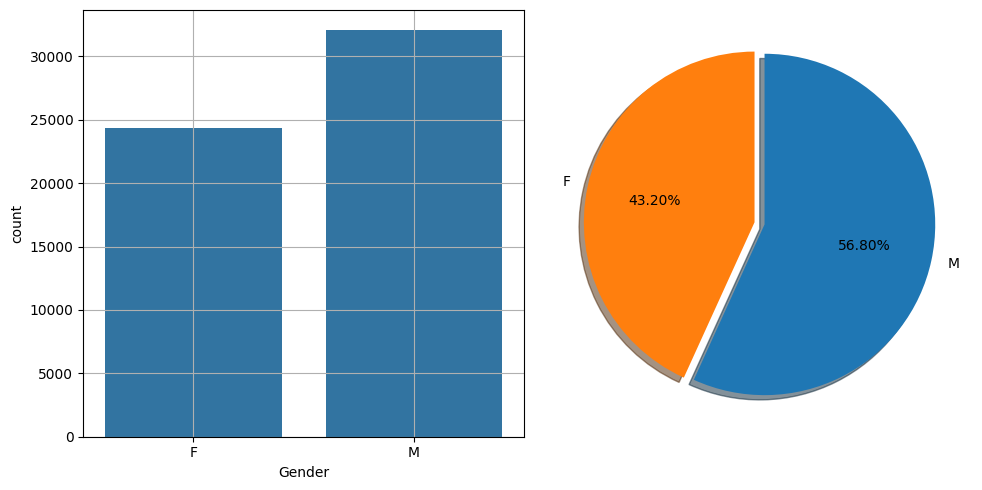

,count,mean,std,min,25%,50%,75%,max
Age,56431.0,36.216796,21.407121,11.0,18.0,28.0,56.0,97.0


Age 단변량 시각화


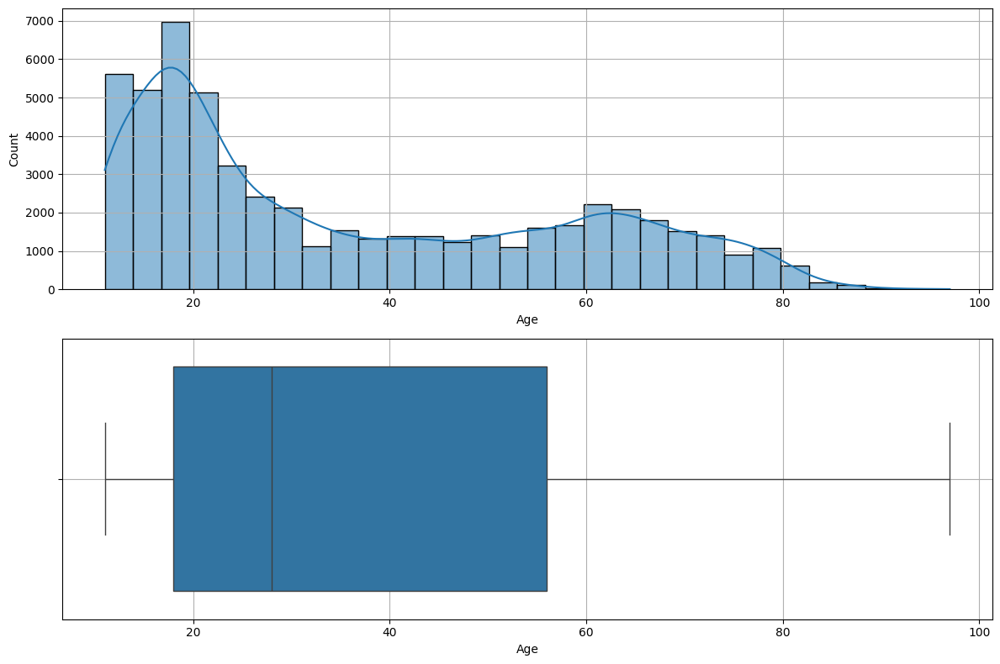

,count,mean,std,min,25%,50%,75%,max
Height,56431.0,162.419012,16.152871,92.8,157.1,165.5,172.7,198.6


Height 단변량 시각화


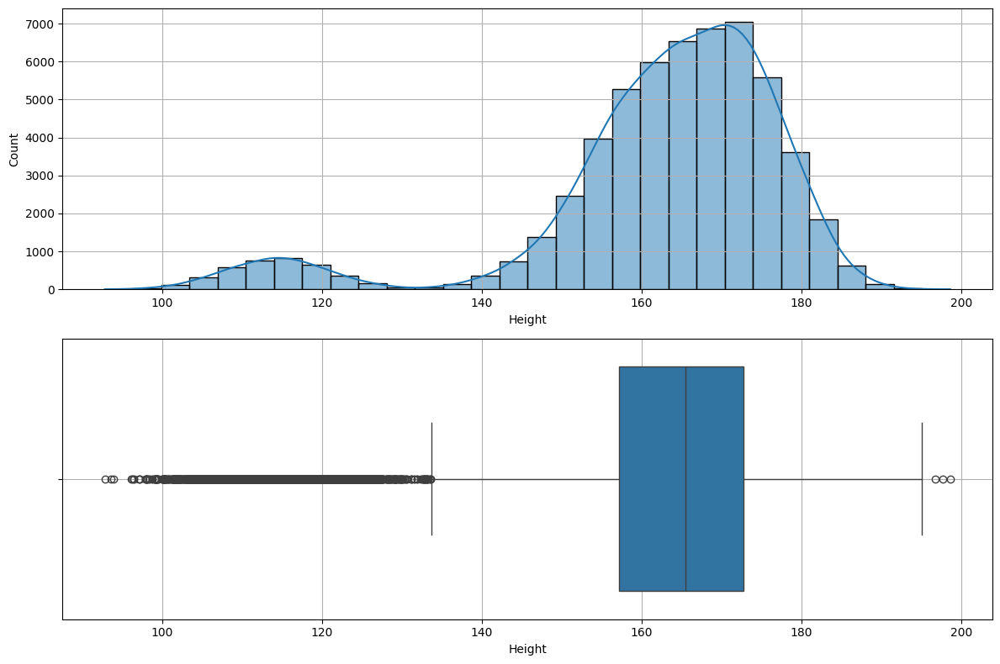

,count,mean,std,min,25%,50%,75%,max
Weight,56431.0,62.13588,18.0346,11.5,52.3,62.4,73.6,167.3


Weight 단변량 시각화


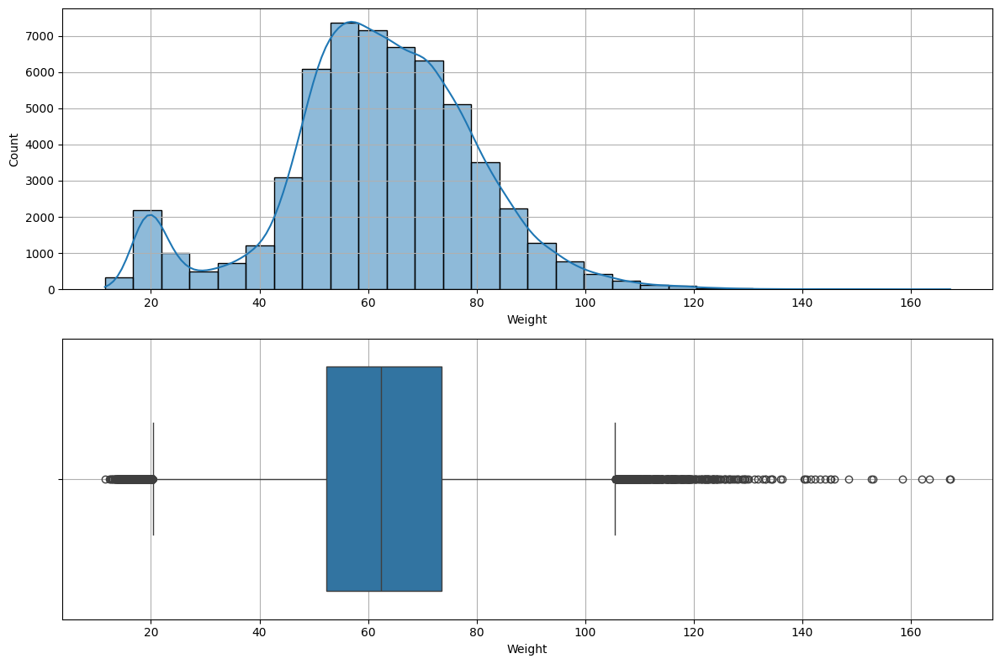

,count,mean,std,min,25%,50%,75%,max
Fat_rate,56431.0,25.7777,7.878681,0.0,20.8,25.6,30.745173,58.4


Fat_rate 단변량 시각화


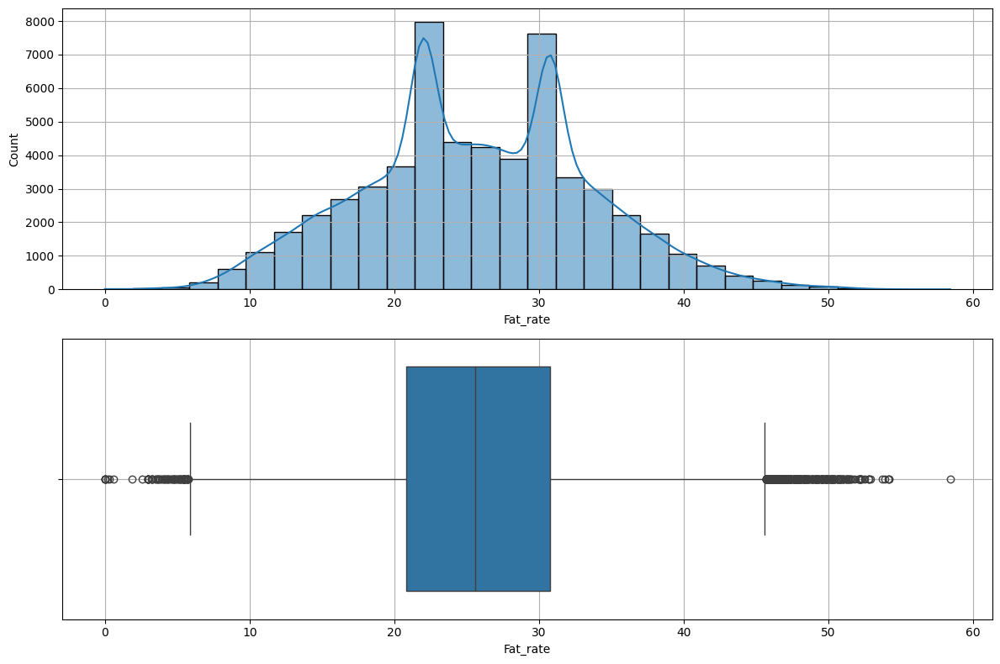

,count,mean,std,min,25%,50%,75%,max
D_min_bld_press,56431.0,77.009414,330.06747,0.0,69.0,76.92431,81.0,78142.7


D_min_bld_press 단변량 시각화


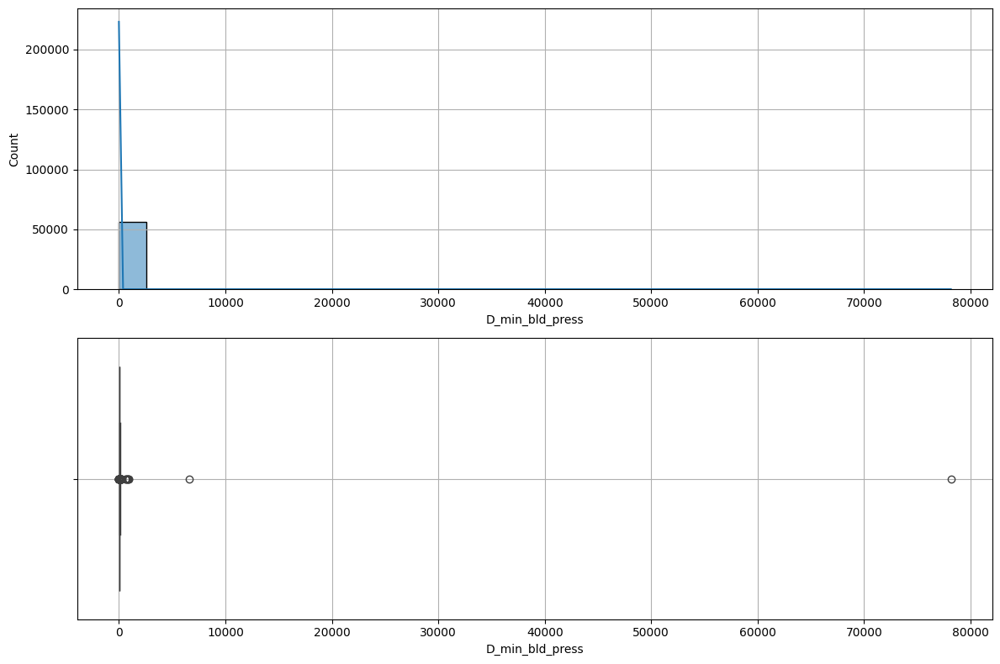

,count,mean,std,min,25%,50%,75%,max
S_max_bld_press,56431.0,127.529597,80.249592,0.0,118.0,125.0,135.0,12767.0


S_max_bld_press 단변량 시각화


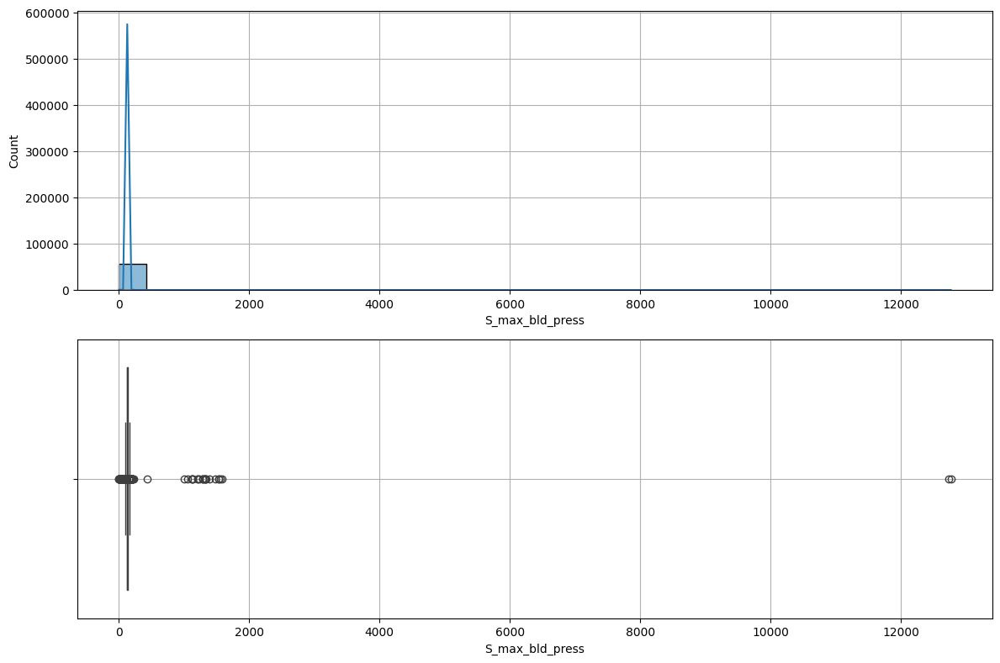

,count,mean,std,min,25%,50%,75%,max
L_grip_force,56431.0,30.386041,12.135357,0.0,21.8,29.3,39.8,94.0


L_grip_force 단변량 시각화


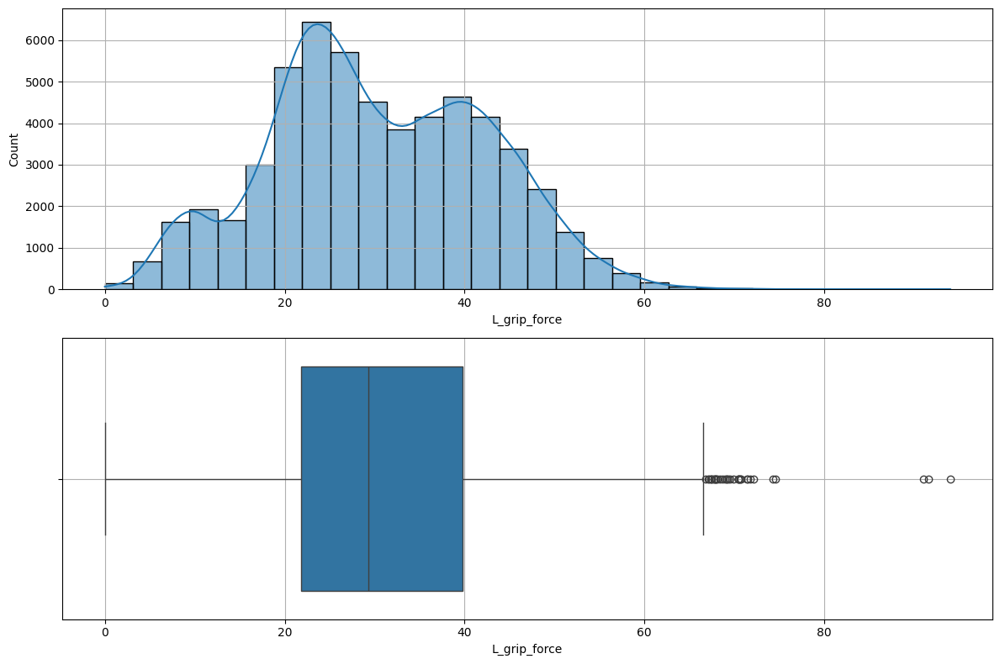

,count,mean,std,min,25%,50%,75%,max
R_grip_force,56431.0,32.407471,12.819368,0.0,23.4,31.2,42.4,89.0


R_grip_force 단변량 시각화


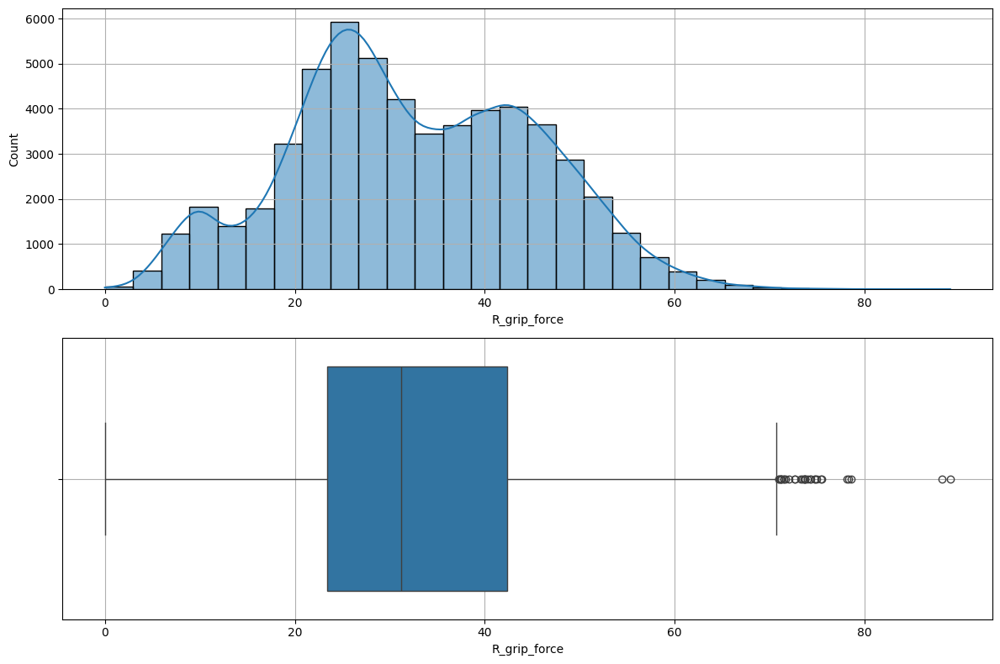

,count,mean,std,min,25%,50%,75%,max
Flexibility,56431.0,10.755649,9.240797,-30.0,5.2,11.5,17.2,50.0


Flexibility 단변량 시각화


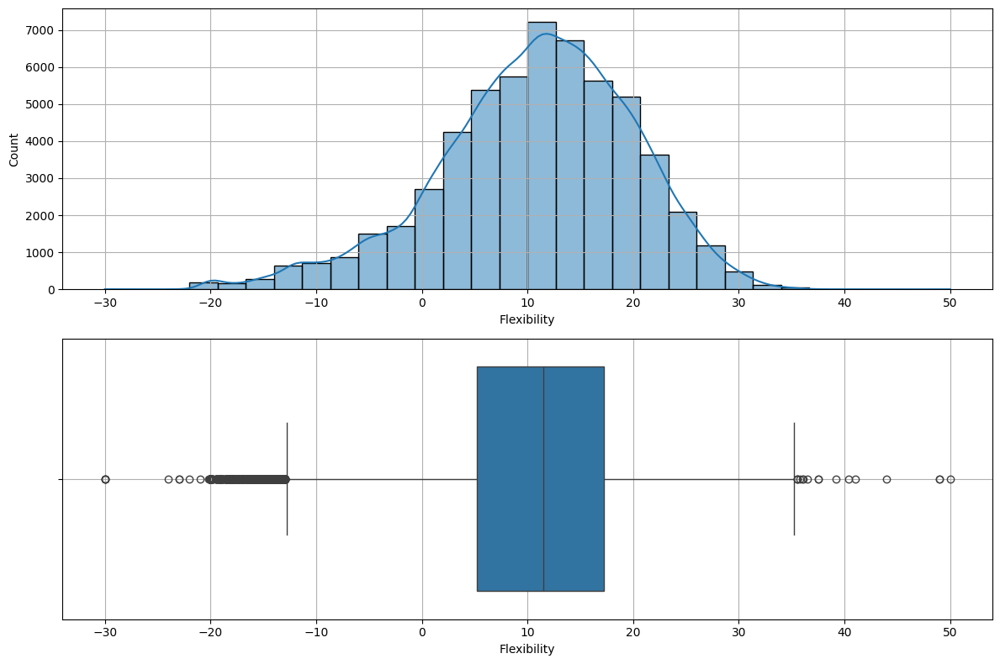

,count,mean,std,min,25%,50%,75%,max
BMI,56431.0,22.965682,4.296502,9.1,20.1,22.9,25.5,76.8


BMI 단변량 시각화


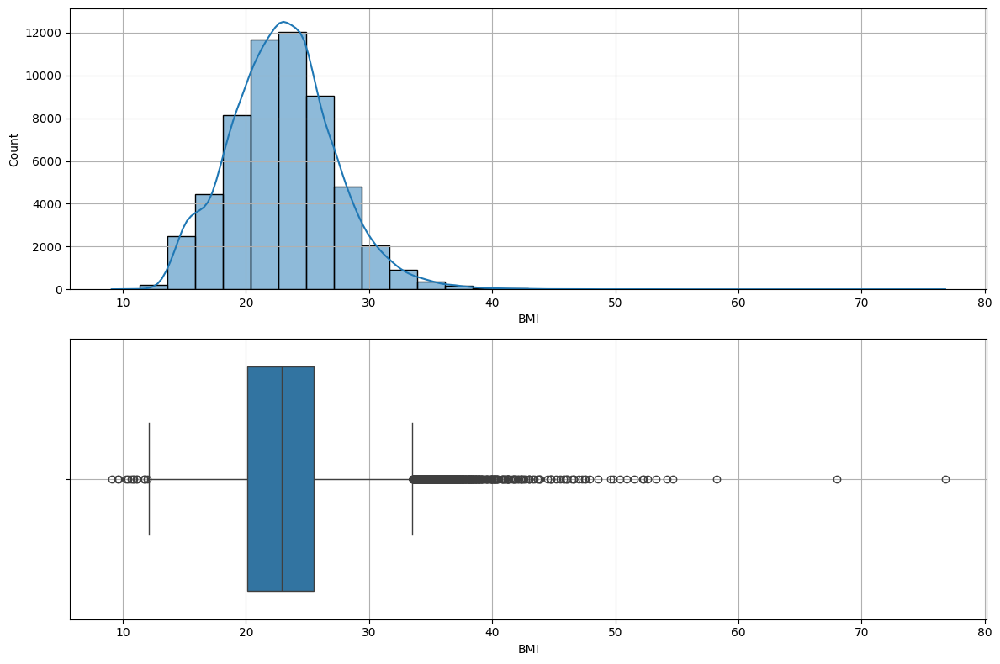

,count,mean,std,min,25%,50%,75%,max
Grip_force_per_weight,56431.0,52.57837,12.713949,0.0,43.7,52.2,61.0,193.2


Grip_force_per_weight 단변량 시각화


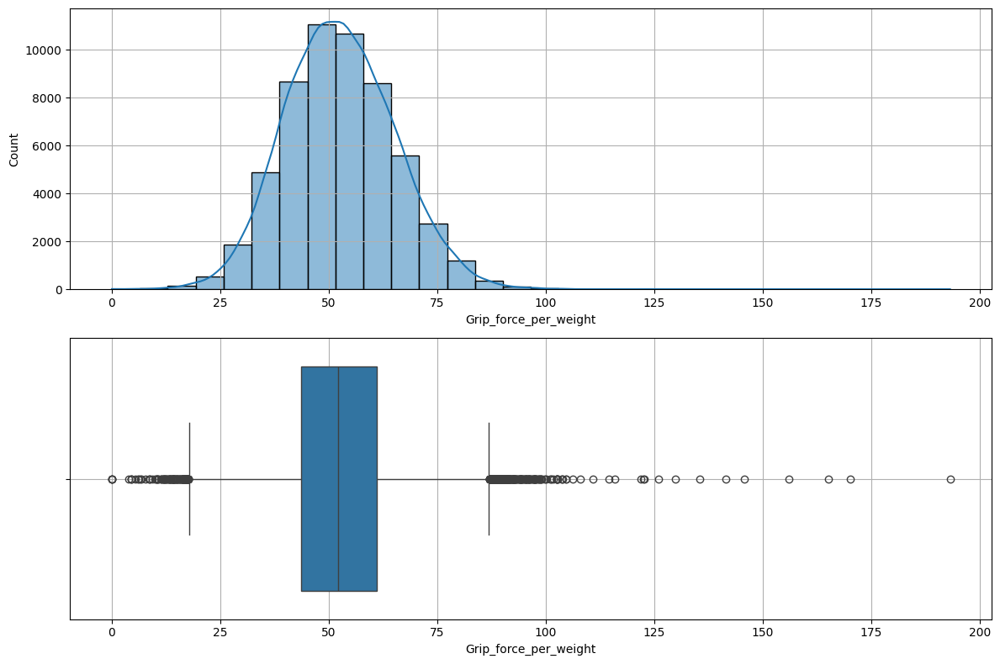

In [ ]:
cat_cols = ['Gender']
for i in cat_cols:
    eda_1_c(i, data_renamed)

num_cols = ['Age', 'Height', 'Weight', 'Fat_rate', 'D_min_bld_press', 'S_max_bld_press','L_grip_force', 'R_grip_force',
            'Flexibility', 'BMI', 'Grip_force_per_weight']
for i in num_cols:
    eda_1_n(i, data_renamed)

In [ ]:
# 이상치 발견
# 키 : 과소측정된 값 존재
# 체중t : 과소측정된 값 존재, 분포로 보아 과대측정은 없다고 판단.
# BMI : 이상치의 기준점이 모호하므로 삭제 후 몸무게/키^2으로 다시 계산
# 악력 : 나이를 고려했을 때 이상치는 없으나, 왼손 악력 795번(나이 11 악력 94), 16094번(성별 여성 체중 47 악력 91)은 이상치로 판단 - 행 삭제
# 혈압 : 최저혈압 이상치 상위 2개 행 / 최고혈압 이상치 상위 26개 행 삭제

In [ ]:
# 이상치 조치

# BMI열 삭제
data_cleaned = data_renamed.drop('BMI', axis=1)

# Height, Weight : 같은 행에서 나란히 이상치 발견 : IQR 기반으로 중앙값 대체
def replace_outliers_median(df, column):
    q1 = df[column].quantile(0.25)  # 1분위수
    q3 = df[column].quantile(0.75)  # 3분위수
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    # 중앙값 계산
    median_value = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)][column].median()

    # 이상치 대체
    df[column] = df[column].apply(lambda x: median_value if x < lower_bound or x > upper_bound else x)
    return df

for i in range(2):
    data_cleaned = replace_outliers_median(data_cleaned, 'Height')
    data_cleaned = replace_outliers_median(data_cleaned, 'Weight')

# 악력 이상치 가진 795번, 16094번 행 삭제
data_cleaned = data_cleaned.drop([795, 16094], axis=0)

# 혈압 이상치 가진 최대혈압 상위 26개, 최저혈압 상위 2개 행 삭제
data_cleaned = data_cleaned.drop(data_cleaned.nlargest(26, 'S_max_bld_press').index)
data_cleaned = data_cleaned.drop(data_cleaned.nsmallest(2, 'D_min_bld_press').index)


In [ ]:
data_renamed.loc[data_renamed['L_grip_force']> 80, :]

,Mesure_round,Age,Grade,Gender,Height,Weight,Fat_rate,D_min_bld_press,S_max_bld_press,L_grip_force,R_grip_force,Flexibility,BMI,Grip_force_per_weight
4774,10,25,1등급,M,173.7,88.1,27.300000,80.000000,142.000000,91.6,78.6,18.1,29.2,104.0
16094,2,20,1등급,F,153.2,47.1,23.100000,21.600000,21.200000,91.0,48.0,20.6,20.1,193.2
795,2,11,참가,M,150.6,55.2,21.999401,77.074145,130.819811,94.0,48.0,2.7,24.3,170.3


In [ ]:
data_renamed['S_max_bld_press'].sort_values(ascending=False).head(26)

,S_max_bld_press
10083,12767.0
5831,12733.0
9798,1582.0
4846,1563.0
9379,1533.0
8814,1525.0
5618,1477.0
19881,1385.0
306,1333.0
5365,1331.0


In [ ]:
data_renamed['D_min_bld_press'].sort_values(ascending=False).head(2)

,D_min_bld_press
11251,78142.7
12294,6628.6


In [ ]:
data_renamed['Weight'].sort_values(ascending=False).head(30)

,Weight
12982,167.3
9292,167.2
3455,163.5
1745,162.1
1764,158.5
1640,153.1
14627,152.8
1036,148.6
1305,146.0
11443,145.4


In [ ]:
data_renamed[['Height','Weight','Age']].sort_values('Height').head(20)

,Height,Weight,Age
2156,92.8,13.2,55
16585,93.6,12.8,51
11455,93.9,12.7,48
17164,96.1,15.1,56
11346,96.2,14.4,53
13596,96.4,16.2,55
16085,96.4,12.5,59
17572,97.0,13.9,51
9622,97.2,14.5,54
1613,97.2,13.0,61


결측치, 이상치 제거 완료

In [ ]:
# Feature 추가 생성
# 삭제했던 BMI 열 추가
data_cleaned['BMI'] = data_cleaned['Weight'] / ((data_cleaned['Height']/100)**2)

# 좌우 악력차
data_cleaned['Grip_force_diff'] = (data_cleaned['L_grip_force'] - data_cleaned['R_grip_force']).abs()

# 혈압차
data_cleaned['Blood_pressure_diff'] = data_cleaned['S_max_bld_press'] - data_cleaned['D_min_bld_press']

# 체지방율 구간 - 남자 14% ~ 20%, 여자 18% ~ 28%, 'Under', 'Fit', 'Over'로 구분
# 함수 생성
def cat_fat(row):
    if row['Gender'] == 'M':
        if row['Fat_rate'] < 14:
            return 'Under'
        elif 14 <= row['Fat_rate'] <= 20:
            return 'Fit'
        else:
            return 'Over'
    elif row['Gender'] == 'F':
        if row['Fat_rate'] < 18:
            return 'Under'
        elif 18 <= row['Fat_rate'] <= 28:
            return 'Fit'
        else:
            return 'Over'

# 체지방율 구간 열 추가
data_cleaned['Fat_category'] = data_cleaned.apply(cat_fat, axis=1)

# 비만 여부 열 추가
data_cleaned['Obesity'] = data_cleaned['BMI'].apply(lambda x: 'Obesity' if x >= 25 else 'Non-Obesity')

In [ ]:
data_cleaned.head()

,Mesure_round,Age,Grade,Gender,Height,Weight,Fat_rate,D_min_bld_press,S_max_bld_press,L_grip_force,R_grip_force,Flexibility,Grip_force_per_weight,BMI,Grip_force_diff,Blood_pressure_diff,Fat_category,Obesity
0,3,18,참가,F,168.7,69.4,32.5,71.0,125.0,30.4,35.6,24.8,51.3,24.385368,5.2,54.0,Over,Non-Obesity
1,1,57,참가,M,162.2,71.3,33.4,76.0,124.0,35.4,33.0,4.2,49.6,27.101157,2.4,48.0,Over,Obesity
2,1,30,2등급,M,169.6,74.3,15.0,91.0,153.0,46.4,46.1,19.5,62.4,25.830756,0.3,62.0,Fit,Obesity
3,1,26,3등급,F,168.5,59.6,22.3,67.0,113.0,23.6,28.6,13.4,48.0,20.991644,5.0,46.0,Fit,Non-Obesity
4,1,64,참가,M,174.3,75.9,27.6,81.0,130.0,39.9,44.6,10.3,58.8,24.983139,4.7,49.0,Over,Non-Obesity


In [ ]:
data_cleaned.shape

(56350, 18)

In [ ]:
data_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 56350 entries, 0 to 16364
Data columns (total 18 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Mesure_round           56350 non-null  int64  
 1   Age                    56350 non-null  int64  
 2   Grade                  56350 non-null  object 
 3   Gender                 56350 non-null  object 
 4   Height                 56350 non-null  float64
 5   Weight                 56350 non-null  float64
 6   Fat_rate               56350 non-null  float64
 7   D_min_bld_press        56350 non-null  float64
 8   S_max_bld_press        56350 non-null  float64
 9   L_grip_force           56350 non-null  float64
 10  R_grip_force           56350 non-null  float64
 11  Flexibility            56350 non-null  float64
 12  Grip_force_per_weight  56350 non-null  float64
 13  BMI                    56350 non-null  float64
 14  Grip_force_diff        56350 non-null  float64
 15  Blood_p

1. 지도학습 기반 '나의 피지컬 등급' 모델링

In [ ]:
from sklearn.model_selection import train_test_split, cross_val_score, KFold, GridSearchCV
from sklearn.preprocessing import MinMaxScaler, StandardScaler, LabelEncoder
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from xgboost import XGBClassifier, XGBRegressor
from lightgbm import LGBMClassifier, LGBMRegressor
from sklearn.metrics import *

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [ ]:
# 데이터 전처리 : target = 'Grade'
# 'Grade'열 값 변경
data_cleaned['Grade'] = data_cleaned['Grade'].replace({'참가':'Bronze', '3등급':'Silver', '2등급':'Gold', '1등급':'Diamond'})

# X, y 분리
X = data_cleaned.drop('Grade', axis=1)
y = data_cleaned['Grade']

# 원핫인코딩
X = pd.get_dummies(X, columns=['Gender', 'Fat_category', 'Obesity'], drop_first=True, dtype=int)

# 트레인셋 테스트셋 분리
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y)

# MinMax스케일링
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# y값 가변수화
le = LabelEncoder()
y_train = le.fit_transform(y_train)
y_test = le.transform(y_test)

In [ ]:
# GridSearch - 성능 시각화 파이프라인
def ml_clf():
    # 학습결과 저장할 딕셔너리 선언
    fitting_result = {}

    # Random Forest
    param = {'max_depth': range(1, 21)}
    model_rdf = GridSearchCV(RandomForestClassifier(random_state=34), param, cv=5)
    model_rdf.fit(X_train, y_train)
    fitting_result['Random Forest'] = [model_rdf.best_score_, model_rdf.best_params_]

    # XGBoost
    param = {'max_depth': range(1, 21)}
    model_xgb = GridSearchCV(XGBClassifier(random_state=34), param, cv=5)
    model_xgb.fit(X_train, y_train)
    fitting_result['XGBoost'] = [model_xgb.best_score_, model_xgb.best_params_]

    # LGBM
    param = {'max_depth': range(1, 21)}
    model_lgb = GridSearchCV(LGBMClassifier(random_state=34, verbose=-1), param, cv=5)
    model_lgb.fit(X_train, y_train)
    fitting_result['LGBM'] = [model_lgb.best_score_, model_lgb.best_params_]

    # 결과 딕셔너리 데이터프레임화
    fit_result = pd.DataFrame([(model, val[0], val[1]) for model, val in fitting_result.items()],
                         columns=['Model', 'Score', 'Parameters'])
    # 데이터프레임 출력
    display(fit_result)

    # 성능 시각화
    sns.barplot(x='Score', y='Model', data=fit_result, orient='h')
    plt.grid(linewidth=0.5)
    plt.tight_layout()
    plt.show()

/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


,Model,Score,Parameters
0,Random Forest,0.691415,{'max_depth': 16}
1,XGBoost,0.706366,{'max_depth': 5}
2,LGBM,0.709006,{'max_depth': 19}


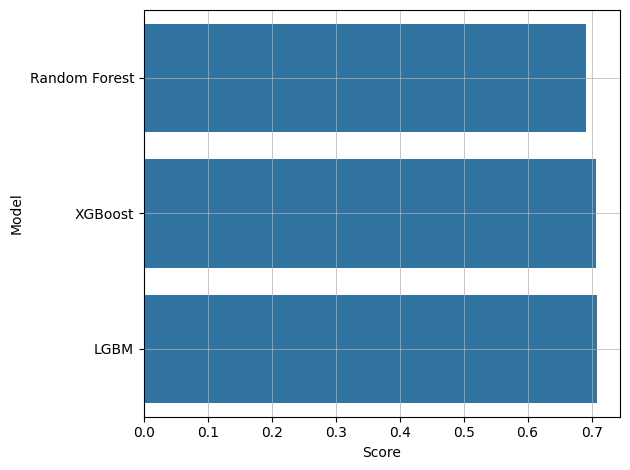

In [ ]:
# GridSearch 및 시각화 진행
ml_clf()

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006243 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2797
[LightGBM] [Info] Number of data points in the train set: 45080, number of used features: 18
[LightGBM] [Info] Start training from score -0.552267
[LightGBM] [Info] Start training from score -2.655023
[LightGBM] [Info] Start training from score -1.949176
[LightGBM] [Info] Start training from score -1.552736


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002961 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2773
[LightGBM] [Info] Number of data points in the train set: 36064, number of used features: 18
[LightGBM] [Info] Start training from score -0.552267
[LightGBM] [Info] Start training from score -2.654707
[LightGBM] [Info] Start training from score -1.949215
[LightGBM] [Info] Start training from score -1.552814
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003132 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2778
[LightGBM] [Info] Number of data points in the train set: 36064, number of used features: 18
[LightGBM] [Info] Start training from score -0.552267
[LightGBM] [Info] Start 

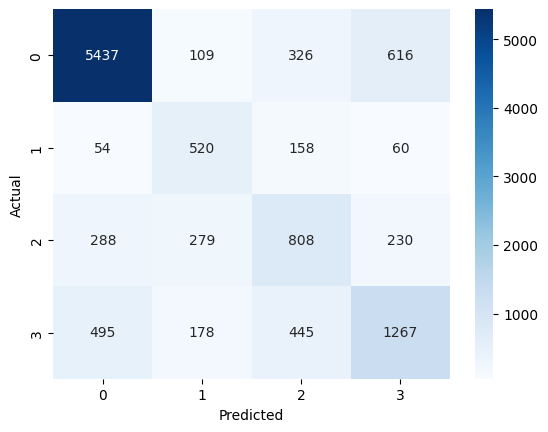

In [ ]:
# 성능이 부족한 관계로 stacking 모델 사용
# 모델 선언
from sklearn.ensemble import StackingClassifier
model_lr = LogisticRegression()
model_dt = DecisionTreeClassifier()
model_knn = KNeighborsClassifier()
model_xgb = XGBClassifier()
model_lgb = LGBMClassifier()
estimators = [('lr', model_lr),
              ('dt', model_dt),
              ('knn', model_knn),
              ('xgb', model_xgb),
              ('lgb', model_lgb)]

model = StackingClassifier(estimators=estimators, final_estimator=RandomForestClassifier(max_depth=20))

# 학습하기
model.fit(X_train, y_train)

# 예측하기
y_pred = model.predict(X_test)

# 평가하기
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

# 성능 시각화
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

[[6488    0    0    0]
 [ 792    0    0    0]
 [1605    0    0    0]
 [2385    0    0    0]]
              precision    recall  f1-score   support

           0       0.58      1.00      0.73      6488
           1       0.00      0.00      0.00       792
           2       0.00      0.00      0.00      1605
           3       0.00      0.00      0.00      2385

    accuracy                           0.58     11270
   macro avg       0.14      0.25      0.18     11270
weighted avg       0.33      0.58      0.42     11270



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


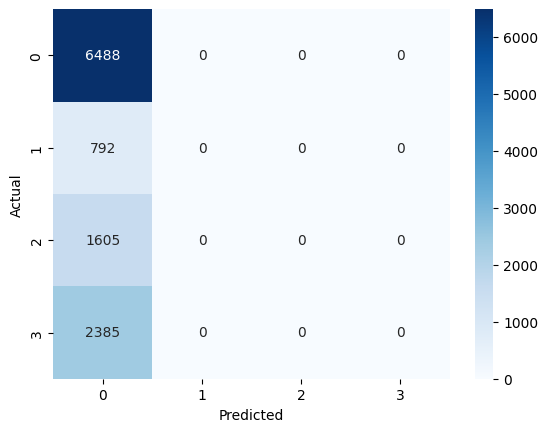

In [ ]:
# 성능 개선을 위해 target 언더샘플링
from imblearn.under_sampling import RandomUnderSampler

# 언더샘플러 정의
rus = RandomUnderSampler()

# 언더샘플링 진행
X_resampled, y_resampled = rus.fit_resample(X, y)

# y 가변수화
le = LabelEncoder()
y_resampled = le.fit_transform(y_resampled)

# 언더샘플링 셋으로 다시 stacking 모델 학습 진행
model02 = StackingClassifier(estimators=estimators, final_estimator=RandomForestClassifier(max_depth=20))

# 학습하기
model02.fit(X_resampled, y_resampled)

# 예측하기
y_pred = model02.predict(X_test)

# 평가하기
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

# 성능 시각화
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004878 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2862
[LightGBM] [Info] Number of data points in the train set: 103800, number of used features: 18
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004102 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2842
[LightGBM] [Info] Number of data points in the train set: 83040, number of used features: 18
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023794 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2836
[LightGBM] [Info] Number of data points in the train set: 83040, number of used features: 18
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training f

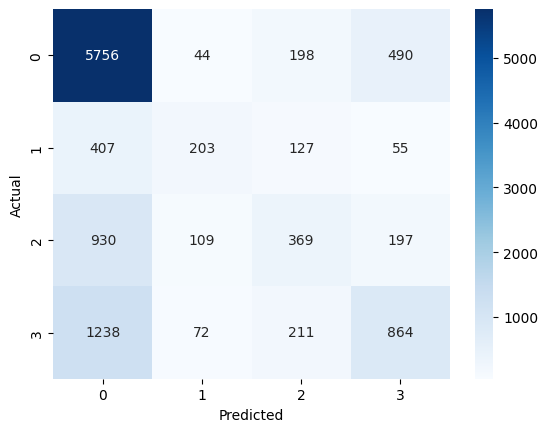

In [ ]:
# 오버샘플링
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler()
X_resampled, y_resampled = ros.fit_resample(X_train, y_train)
y_resampled = le.fit_transform(y_resampled)

# 오버샘플링 셋으로 다시 stacking 모델 학습 진행
model03 = StackingClassifier(estimators=estimators, final_estimator=RandomForestClassifier(max_depth=20))

# 학습하기
model03.fit(X_resampled, y_resampled)

# 예측하기
y_pred = model03.predict(X_test)

# 평가하기
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

# 성능 시각화
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [ ]:
# 오버샘플링 방식 개선
from imblearn.over_sampling import SMOTE

# SMOTE를 통한 오버샘플링
smote = SMOTE()
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

# y_resapmled 가변수화
y_resampled = le.fit_transform(y_resampled)

# 모델 정의 (클래스 가중치 포함)
model04 = StackingClassifier(
    estimators=estimators,
    final_estimator=RandomForestClassifier(max_depth=20, class_weight='balanced')
)

# 학습하기
model04.fit(X_resampled, y_resampled)

# 예측하기
y_pred = model04.predict(X_test)

# 평가하기
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

# 성능 시각화
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


KeyboardInterrupt: 

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003840 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3579
[LightGBM] [Info] Number of data points in the train set: 82062, number of used features: 18
[LightGBM] [Info] Start training from score -1.721057
[LightGBM] [Info] Start training from score -1.174105
[LightGBM] [Info] Start training from score -1.280408
[LightGBM] [Info] Start training from score -1.451992


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003684 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3579
[LightGBM] [Info] Number of data points in the train set: 65649, number of used features: 18
[LightGBM] [Info] Start training from score -1.721065
[LightGBM] [Info] Start training from score -1.174096
[LightGBM] [Info] Start training from score -1.280431
[LightGBM] [Info] Start training from score -1.451970
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003309 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3579
[LightGBM] [Info] Number of data points in the train set: 65649, number of used features: 18
[LightGBM] [Info] Start training from score -1.721065
[LightGBM] [Info] Start 

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [04:58:56] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)


[[4635  165  564 1124]
 [   3  404  274  111]
 [  57  317  766  465]
 [ 232  219  543 1391]]
              precision    recall  f1-score   support

           0       0.94      0.71      0.81      6488
           1       0.37      0.51      0.43       792
           2       0.36      0.48      0.41      1605
           3       0.45      0.58      0.51      2385

    accuracy                           0.64     11270
   macro avg       0.53      0.57      0.54     11270
weighted avg       0.71      0.64      0.66     11270



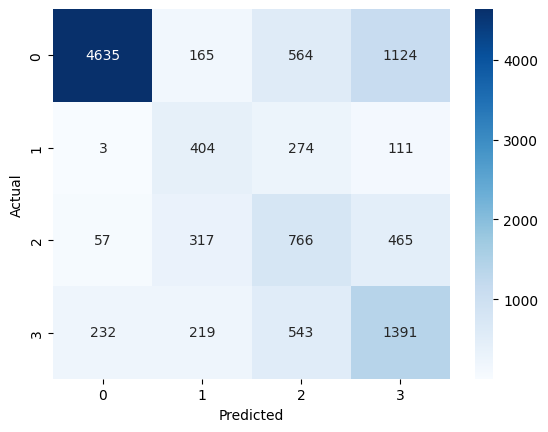

In [ ]:
# 오버샘플링 방법 개선 2
from imblearn.combine import SMOTEENN

# SMOTEENN으로 데이터 리샘플링
smote_enn = SMOTEENN()
X_resampled, y_resampled = smote_enn.fit_resample(X_train, y_train)

# y_resampled 가변수화
y_resampled = le.fit_transform(y_resampled)

# 모델 정의
model05 = StackingClassifier(
    estimators=estimators,
    final_estimator=XGBClassifier(max_depth=20, scale_pos_weight={0: 1, 1: 5, 2: 5, 3: 5})
)

# 모델 학습
model05.fit(X_resampled, y_resampled)

# 예측
y_pred = model05.predict(X_test)

# 평가
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

# 시각화
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


군집분석

In [ ]:
# 군집분석을 위해 타겟 열 제거
data_cluster = data_cleaned.drop('Grade', axis=1)

# 원핫인코딩을 통한 가변수화
data_cluster = pd.get_dummies(data_cluster, columns=['Gender', 'Fat_category', 'Obesity'], drop_first=True, dtype=int)

# 스케일링
scaler = MinMaxScaler()
data_scaled = scaler.fit_transform(data_cluster)

# 열 이름 유지를 위해 데이터프레임으로 변환
data_pre = pd.DataFrame(data_scaled, columns=data_cluster.columns)

# 확인
data_pre.head()

,Mesure_round,Age,Height,Weight,Fat_rate,D_min_bld_press,S_max_bld_press,L_grip_force,R_grip_force,Flexibility,Grip_force_per_weight,BMI,Grip_force_diff,Blood_pressure_diff,Gender_M,Fat_category_Over,Fat_category_Under,Obesity_Obesity
0,0.032787,0.081395,0.550193,0.577519,0.556507,0.000883,0.539130,0.331878,0.400000,0.68500,0.310721,0.449001,0.081761,0.998874,0.0,1.0,0.0,0.0
1,0.000000,0.534884,0.424710,0.602067,0.571918,0.000947,0.534783,0.386463,0.370787,0.42750,0.300424,0.527796,0.037736,0.998797,1.0,1.0,0.0,1.0
2,0.000000,0.220930,0.567568,0.640827,0.256849,0.001139,0.660870,0.506550,0.517978,0.61875,0.377953,0.490937,0.004717,0.998976,1.0,0.0,0.0,1.0
3,0.000000,0.174419,0.546332,0.450904,0.381849,0.000832,0.486957,0.257642,0.321348,0.54250,0.290733,0.350537,0.078616,0.998772,0.0,0.0,0.0,0.0
4,0.000000,0.616279,0.658301,0.661499,0.472603,0.001011,0.560870,0.435590,0.501124,0.50375,0.356148,0.466345,0.073899,0.998810,1.0,1.0,0.0,0.0


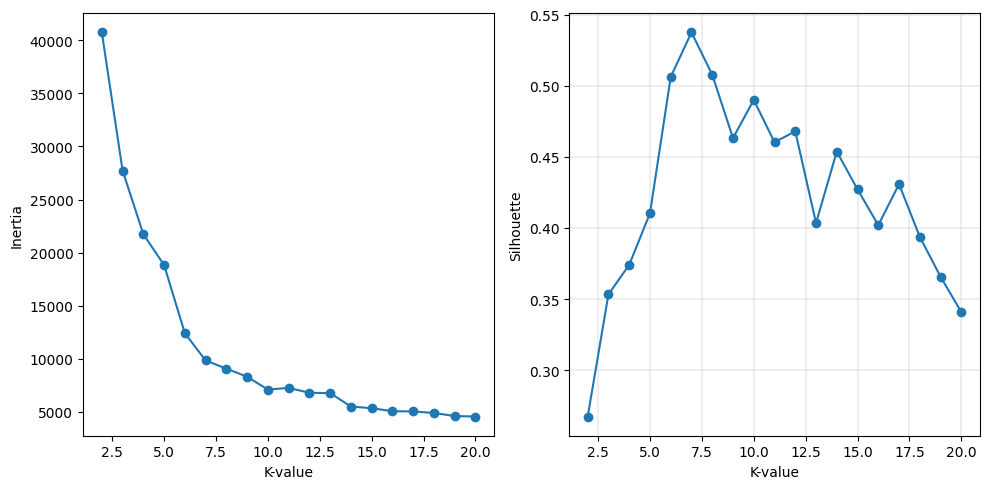

,k,Inertia,Silhouette
0,2,40736.095571,0.267633
1,3,27724.391255,0.353502
2,4,21734.187835,0.374216
3,5,18829.727187,0.410420
4,6,12413.442219,0.506202
5,7,9848.473381,0.537544
6,8,9078.365199,0.507779
7,9,8317.875276,0.463242
8,10,7102.954070,0.490112
9,11,7271.645599,0.460311


In [ ]:
# 엘보우 메서드와 실루엣 점수를 활용하여 K-Means 모델의 클러스터 개수 설정
# 실루엣 점수와 엘보우 메서드 둘 다 사용
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# 모델 생성
kvalue = range(2, 21)
ks = []
inertia = []
sil_score = []
for k in kvalue:
    model11 = KMeans(n_clusters=k, n_init='auto')
    model11.fit(data_pre)
    pred = model11.predict(data_pre)
    ks.append(k)
    inertia.append(model11.inertia_)
    sil_score.append(silhouette_score(data_pre, pred))

# 시각화
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(kvalue, inertia, marker='o')
plt.xlabel('K-value')
plt.ylabel('Inertia')
plt.subplot(1, 2, 2)
plt.plot(kvalue, sil_score, marker='o')
plt.xlabel('K-value')
plt.ylabel('Silhouette')
plt.grid(lw=0.3)
plt.tight_layout()
plt.show()

# 스코어 출력
result = pd.DataFrame({
    'k': ks,
    'Inertia': inertia,
    'Silhouette': sil_score
})
display(result)

In [ ]:
# k= 7로 결정

In [ ]:
# 7개 군집으로 K-Means 분석 실시
from sklearn.cluster import KMeans
model12 = KMeans(n_clusters=7, n_init='auto')
model12.fit(data_pre)
pred = model12.predict(data_pre)

# 최종 결과 프레임 생성
data_final = data_cleaned.drop('Grade', axis=1)

# 예측 결과를 데이터프레임으로 만들고
pred_df = pd.DataFrame(pred, columns=['Cluster'])





In [ ]:
# 원본 데이터와 합치기
data_final.reset_index(drop=True, inplace=True)
X_clusterd = pd.concat([data_final, pred_df], axis=1)

# 예측 결과는 카테고리 타입으로 변경
X_clusterd['Cluster'] = pd.Categorical(X_clusterd['Cluster'])

In [ ]:
# X_clisterd 컬럼 확인
X_clusterd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56350 entries, 0 to 56349
Data columns (total 18 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   Mesure_round           56350 non-null  int64   
 1   Age                    56350 non-null  int64   
 2   Gender                 56350 non-null  object  
 3   Height                 56350 non-null  float64 
 4   Weight                 56350 non-null  float64 
 5   Fat_rate               56350 non-null  float64 
 6   D_min_bld_press        56350 non-null  float64 
 7   S_max_bld_press        56350 non-null  float64 
 8   L_grip_force           56350 non-null  float64 
 9   R_grip_force           56350 non-null  float64 
 10  Flexibility            56350 non-null  float64 
 11  Grip_force_per_weight  56350 non-null  float64 
 12  BMI                    56350 non-null  float64 
 13  Grip_force_diff        56350 non-null  float64 
 14  Blood_pressure_diff    56350 non-null 

In [ ]:
# 각 값 시각화 함수
def cluster_plot(feature, data=X_clusterd):
  plt.figure(figsize=(10,4))
  plt.subplot(1, 2, 1)
  sns.kdeplot(x= feature, data = X_clusterd, hue='Cluster')
  plt.grid()

  plt.subplot(1,2,2)
  sns.boxplot( x= feature, data = X_clusterd, hue = 'Cluster')
  plt.grid()

  plt.tight_layout()
  plt.show()

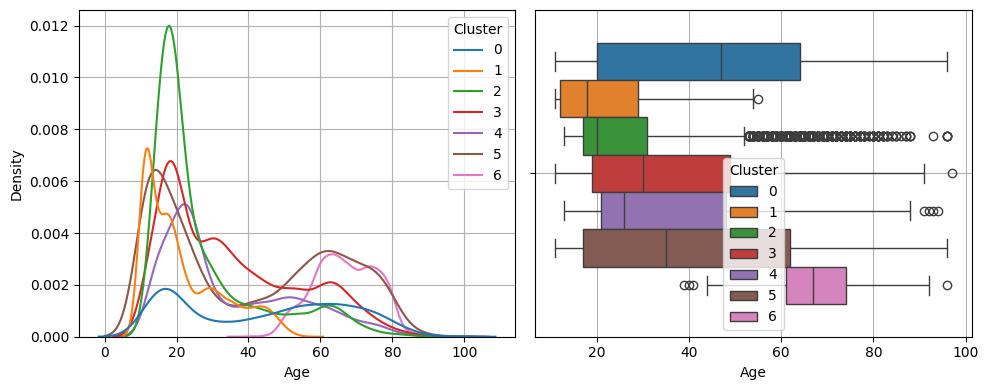

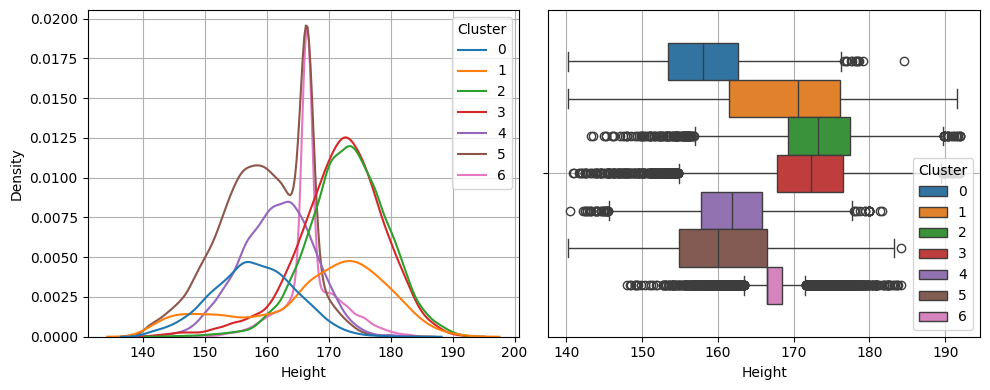

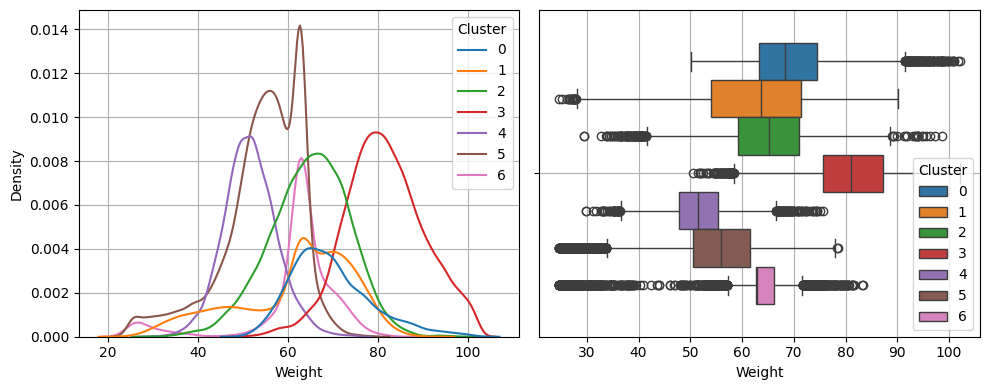

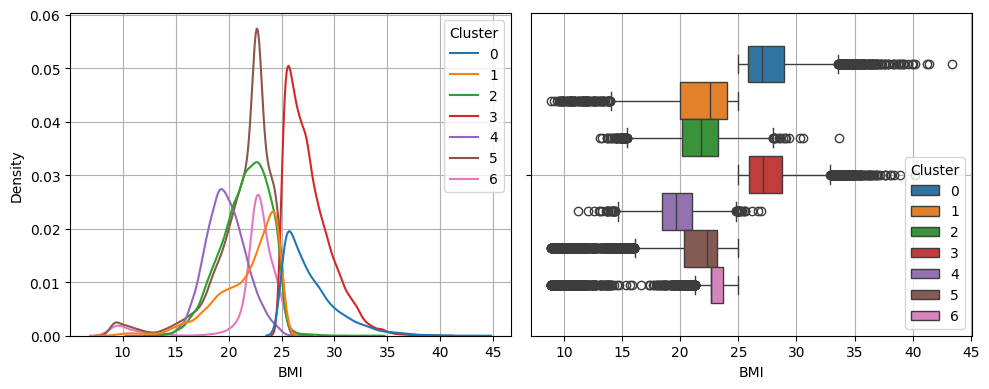

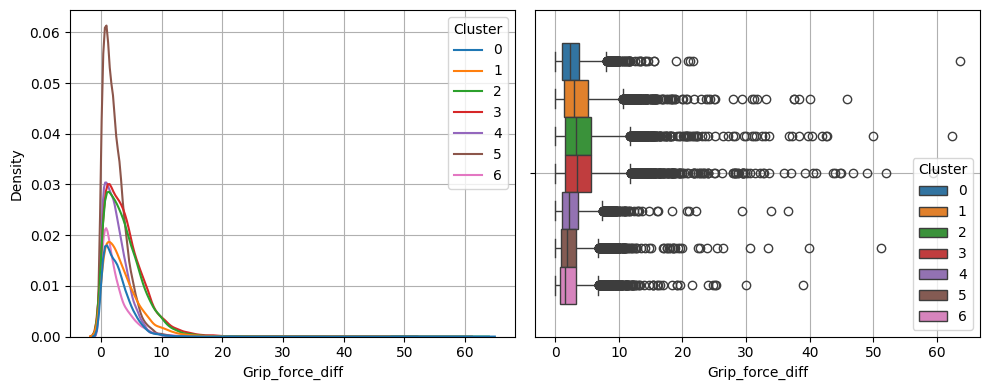

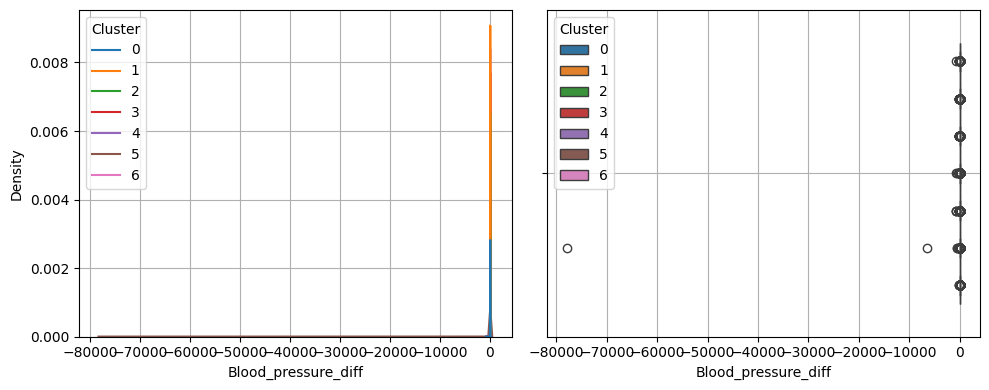

In [ ]:
# 컬럼별 시각화
cluster_plot('Age')
cluster_plot('Height')
cluster_plot('Weight')
cluster_plot('BMI')
cluster_plot('Grip_force_diff')
cluster_plot('Blood_pressure_diff')

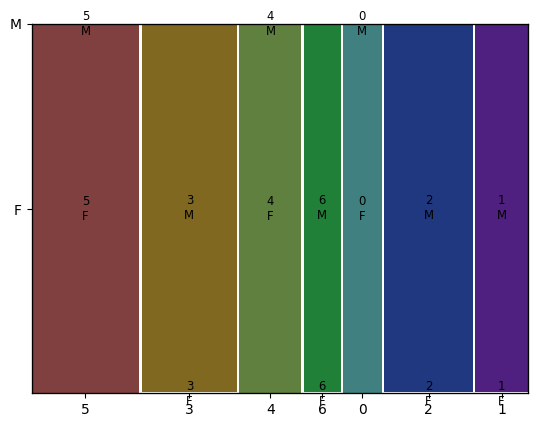

In [ ]:
mosaic(X_clusterd, ['Cluster', 'Gender'])
plt.show()

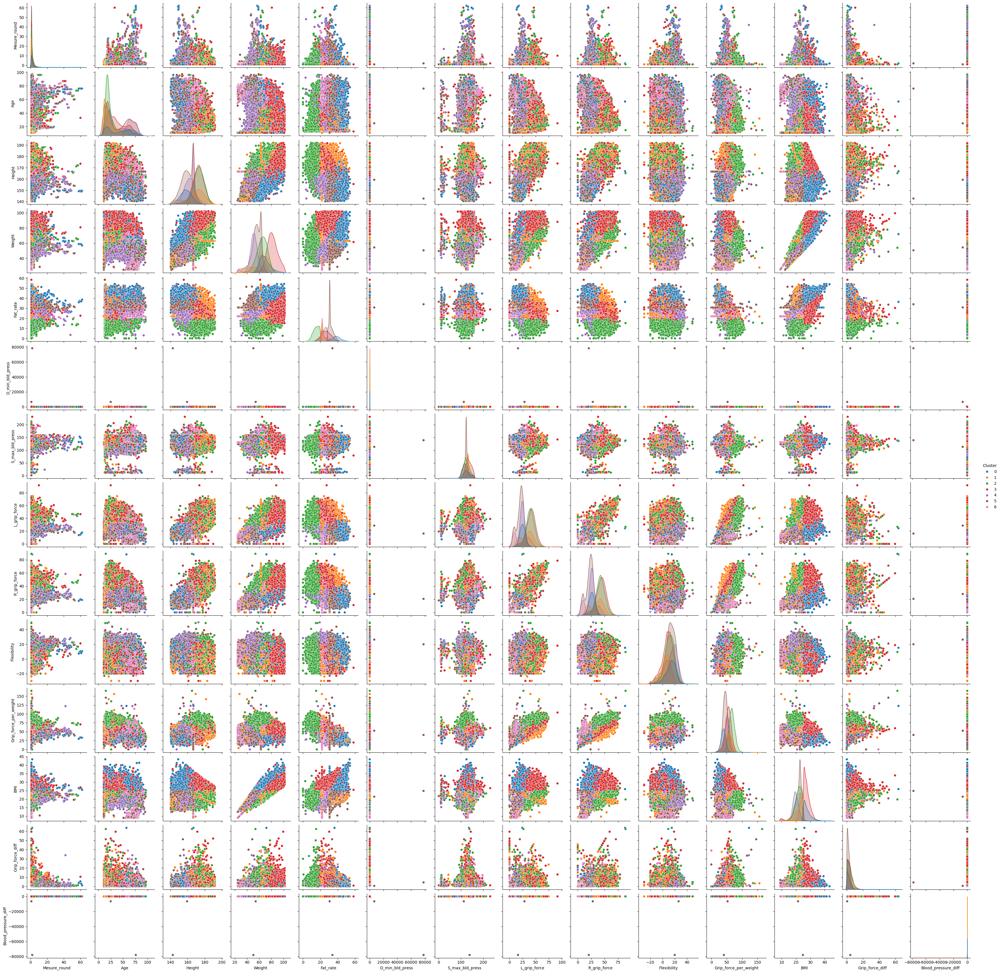

In [ ]:
sns.pairplot(X_clusterd, hue='Cluster')
plt.show()